In [2]:
from m_star_predictor import (
    LinearRegression, FCNN, fit_model,
)

from utility import (
    normalize, real_units, reduce_dataset, compute_rmse
)

import torch
import torch.utils.data as Data
from torch.utils.data import random_split
from torch import optim
import numpy as np
import os

import matplotlib.pyplot as plt

# Ensuring reproducibility
np.random.seed(14)
torch.manual_seed(123);
sklear_random_state = 123

# Trajectories

In [2]:
fcnn_traj_1, fcnn_name_1 = np.load('m_star_predictors/fcnn_ylog_nns_3000_nls_3_wd_5e-4_lr_5e-5_tanh_all_plus_rhop_dz1_nohf_inst_predictor_3000_epochs_trajectory.npy'), "dz = 1m"
fcnn_traj_2, fcnn_name_2 = np.load('m_star_predictors/fcnn_ylog_nns_3000_nls_3_wd_5e-4_lr_5e-5_tanh_all_plus_rhop_dz0.1_nohf_inst_predictor_3000_epochs_trajectory.npy'), "dz = 0.1m"

Text(0.5, 0, 'Epoch')

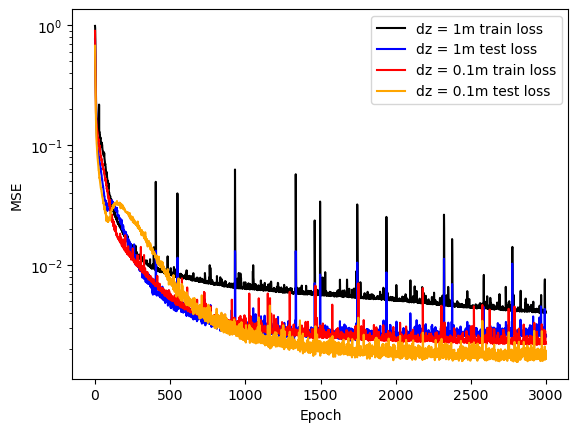

In [4]:
plt.plot(fcnn_traj_1[0], color="black", label=f"{fcnn_name_1} train loss")
plt.plot(fcnn_traj_1[1], color="blue", label=f"{fcnn_name_1} test loss")
plt.plot(fcnn_traj_2[0], color="red", label=f"{fcnn_name_2} train loss")
plt.plot(fcnn_traj_2[1], color="orange", label=f"{fcnn_name_2} test loss")
plt.gca().set_yscale("log")
plt.legend()
plt.ylabel("MSE")
plt.xlabel("Epoch")

Text(0.5, 0, 'Epoch')

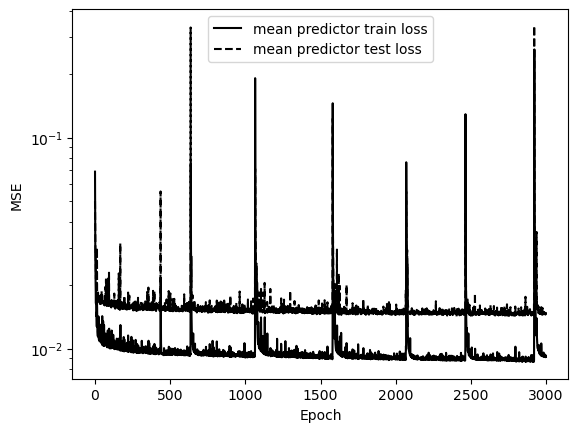

In [17]:
plt.plot(fcnn_traj_1[0], color="black", label=f"{fcnn_name_1} train loss")
plt.plot(fcnn_traj_1[1], color="black", linestyle="dashed", label=f"{fcnn_name_1} test loss")
plt.gca().set_yscale("log")
plt.legend()
plt.ylabel("MSE")
plt.xlabel("Epoch")

Text(0.5, 0, 'Epoch')

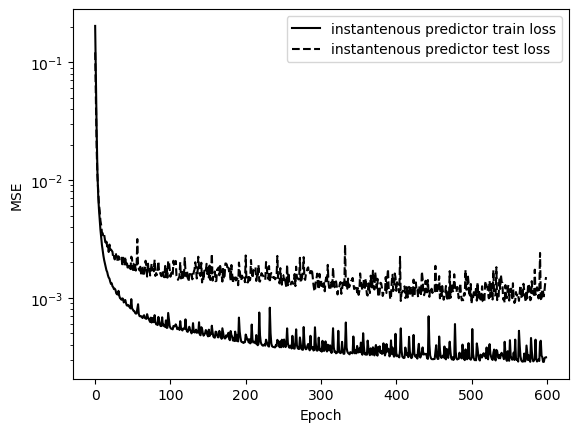

In [22]:
plt.plot(fcnn_traj_2[0], color="black", label=f"{fcnn_name_2} train loss")
plt.plot(fcnn_traj_2[1], color="black", linestyle="dashed", label=f"{fcnn_name_2} test loss")
plt.gca().set_yscale("log")
plt.legend()
plt.ylabel("MSE")
plt.xlabel("Epoch")

# Predictions

In [3]:
def get_predictions(
        data,
        validation_data,
        indices,
        path_to_weights,
        n_hidden_layers = 1,
        n_neurons = 16,
        activation = torch.nn.ReLU(),
        y_transform = "sqrt"

):
    if not indices:
        indices = list(range(data.shape[0]-1))
        print(indices)
    else:
        pass

    X, y = data.T[:,indices].float(), data.T[:,-1].unsqueeze(1).float()
    X_val, y_val = validation_data.T[:,indices].float(), validation_data.T[:,-1].unsqueeze(1).float()
    fcnn_network = FCNN(input_size=len(indices), n_neurons=n_neurons, n_hidden_layers=n_hidden_layers, activation=activation)

    state_dict = torch.load(path_to_weights, map_location=torch.device('cpu'))
    fcnn_network.load_state_dict(state_dict)

    X_mean = X.mean(dim=0)
    X_std = X.std(dim=0)

    if y_transform == "sqrt":
        y_mean = y.sqrt().mean(dim=0)
        y_std = 2*y.sqrt().std(dim=0)
    elif y_transform == "log":
        y_mean = y.log10().mean(dim=0)
        y_std = y.log10().std(dim=0)

    X_normalized = normalize(data=X, mean=X_mean, std=X_std)
    fcnn_prediction = real_units(normalized_data=fcnn_network(X_normalized), mean=y_mean, std=y_std)

    X_val_normalized = normalize(data=X_val, mean=X_mean, std=X_std)
    fcnn_prediction_val = real_units(normalized_data=fcnn_network(X_val_normalized), mean=y_mean, std=y_std)

    if y_transform == "sqrt":
        fcnn_prediction = fcnn_prediction**2
        fcnn_prediction_val = fcnn_prediction_val**2
    elif y_transform == "log":
        fcnn_prediction = 10**fcnn_prediction
        fcnn_prediction_val = 10**fcnn_prediction_val

    return X, y, X_val, y_val, fcnn_prediction, fcnn_prediction_val


In [6]:
data_directory = '../m_star_dataset'

dataset_name_1 = 'ePBL_paper_2283_corrected_dz0.1_nohf'
dataset_name_2 = 'ePBL_paper_2283_corrected_dz1_nohf'
validation_dataset_name_1 = 'ePBL_paper_validation_2283_corrected_dz0.1_nohf'
validation_dataset_name_2 = 'ePBL_paper_validation_2283_corrected_dz1_nohf'

dataset_1_filename = f"{dataset_name_1}_dataset_M_target_all.pt"
dataset_2_filename = f"{dataset_name_2}_dataset_M_target_all.pt"
# dataset_2_filename = f"{dataset_name_2}_dataset_M_target_bl_smoothed_log_NN_SS_Rig_unfiltered_uv.pt"
validation_dataset_1_filename = f"{validation_dataset_name_1}_dataset_M_target_all.pt"
validation_dataset_2_filename = f"{validation_dataset_name_2}_dataset_M_target_all.pt"
# validation_dataset_2_filename = f"{validation_dataset_name_2}_dataset_M_target_bl_smoothed_log_NN_SS_Rig_unfiltered_uv.pt"

data_1 = torch.load(os.path.join(data_directory, dataset_1_filename))
data_2 = torch.load(os.path.join(data_directory, dataset_2_filename))
validation_data_1 = torch.load(os.path.join(data_directory, validation_dataset_1_filename))
validation_data_2 = torch.load(os.path.join(data_directory, validation_dataset_2_filename))

path_to_weights_1 = f"/home/mm6851/m_star_predictor/m_star_predictors/fcnn_ylog_nns_3000_nls_3_wd_5e-4_lr_5e-5_tanh_all_plus_rhop_dz0.1_nohf_inst_predictor_3000_epochs_weights.pth"
path_to_weights_2 = f"/home/mm6851/m_star_predictor/m_star_predictors/fcnn_ylog_nns_3000_nls_3_wd_5e-4_lr_5e-5_tanh_all_plus_rhop_dz1_nohf_inst_predictor_3000_epochs_weights.pth"
# path_to_weights_2 = f"/home/mm6851/m_star_predictor/m_star_predictors/fcnn_ysqrt_nns_128_nls_3_wd_5e-4_tanh_smoothed_bl_angle_mag_unfiltered_inst_predictor_weights.pth"

name_1 = "dz = 0.1m"
name_2 = "dz = 1m"
# name_1 = "filtered"
# name_2 = "unfiltered"

In [7]:
import json

with open(os.path.join(data_directory, f'{dataset_name_1}_training_set_cases.json'), 'r') as file:
    gotm_case_dict = json.load(file)

with open(os.path.join(data_directory, f'{validation_dataset_name_1}_training_set_cases.json'), 'r') as file:
    gotm_validation_case_dict = json.load(file)

In [8]:
# indices_1 = [0,1,2,3,4,5]
# indices_2 = [0,1,2,3,4,5]
# indices_2 = [0,1,2,3,4,5,9]
indices_1, indices_2 = None, None

In [9]:
X_1, y_1, X_1_val, y_val_1, fcnn_prediction_1, fcnn_prediction_val_1 = get_predictions(data_1, validation_data_1, indices_1, path_to_weights_1, 3, 128, activation=torch.nn.Tanh(), y_transform="log")
X_2, y_2, X_2_val, y_val_2, fcnn_prediction_2, fcnn_prediction_val_2 = get_predictions(data_2, validation_data_2, indices_2, path_to_weights_2, 3, 128, activation=torch.nn.Tanh(), y_transform="log")

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


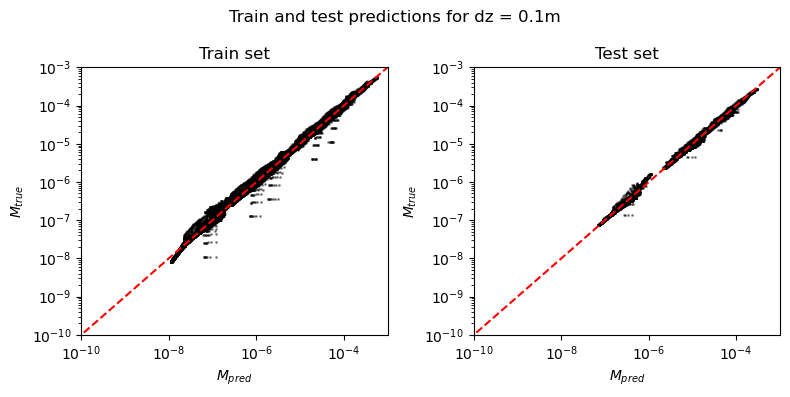

In [75]:
xs, ys = np.linspace(0., 6e-3, 1000), np.linspace(0., 6e-3, 1000)

fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].scatter(fcnn_prediction_1.detach().numpy(), y_1, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")
ax[0].set_title("Train set")

ax[1].scatter(fcnn_prediction_val_1.detach().numpy(), y_val_1, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")
ax[1].set_title("Test set")

fig.suptitle(f"Train and test predictions for {name_1}")

for a in ax:
    a.set_xscale("log")
    a.set_yscale("log")
    a.set_xlim(1e-10, 1e-3)
    a.set_ylim(1e-10, 1e-3)

fig.tight_layout()

plt.savefig(f"inst_M_true_pred_{name_1}.png", dpi=300)

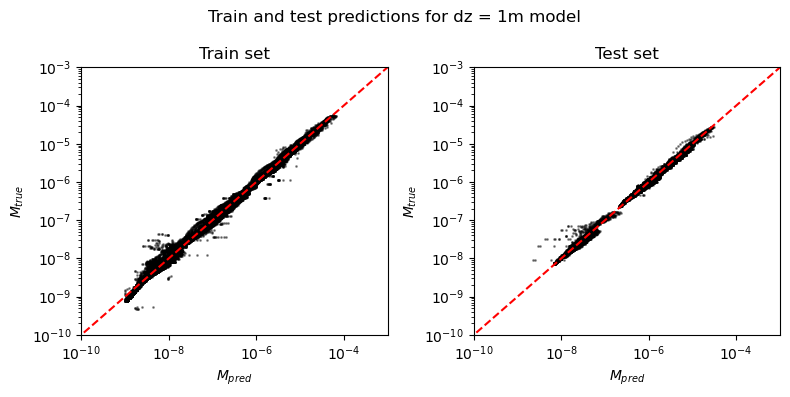

In [76]:
xs, ys = np.linspace(0., 6e-3, 1000), np.linspace(0., 6e-3, 1000)

fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].scatter(fcnn_prediction_2.detach().numpy(), y_2, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")
ax[0].set_title("Train set")

ax[1].scatter(fcnn_prediction_val_2.detach().numpy(), y_val_2, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")
ax[1].set_title("Test set")

fig.suptitle(f"Train and test predictions for {name_2} model")

for a in ax:
    a.set_xscale("log")
    a.set_yscale("log")
    a.set_xlim(1e-10, 1e-3)
    a.set_ylim(1e-10, 1e-3)

fig.tight_layout()

plt.savefig(f"inst_M_true_pred_{name_2}.png", dpi=300)

In [77]:
compute_rmse(fcnn_prediction_val_1, y_val_1)

tensor(3.0939e-06, grad_fn=<SqrtBackward0>)

In [78]:
compute_rmse(fcnn_prediction_val_2, y_val_2)

tensor(3.9594e-07, grad_fn=<SqrtBackward0>)

In [11]:
n_timesteps = 479

/tmp/ipykernel_199721/2515959042.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2,1,figsize=(10,6),tight_layout=True,sharex=True)


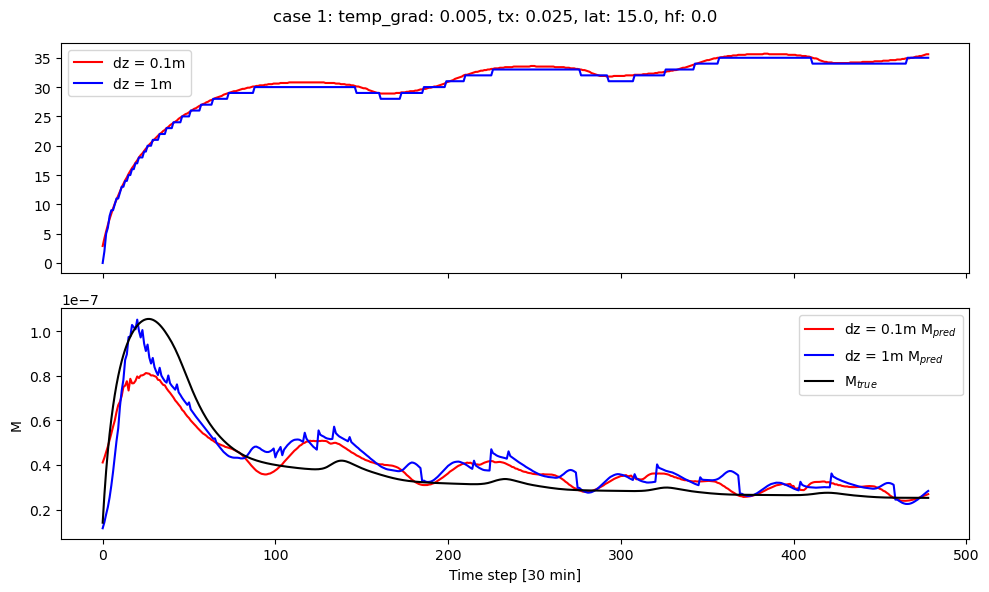

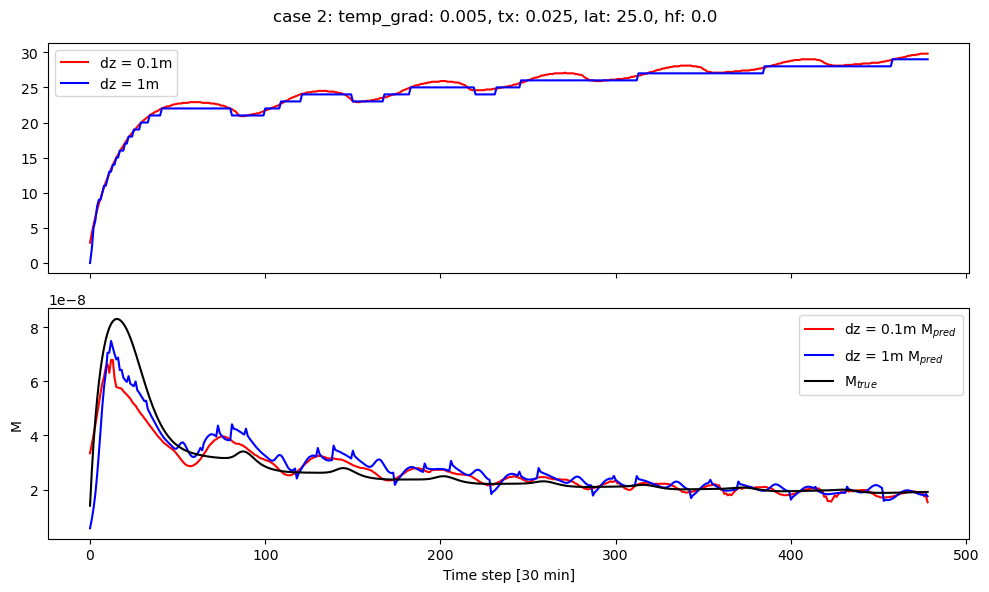

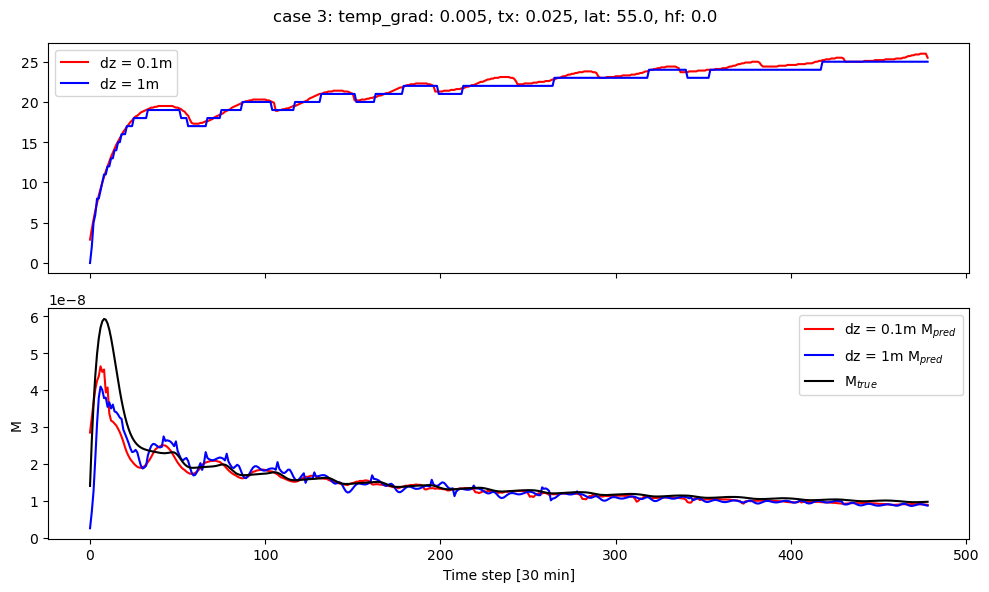

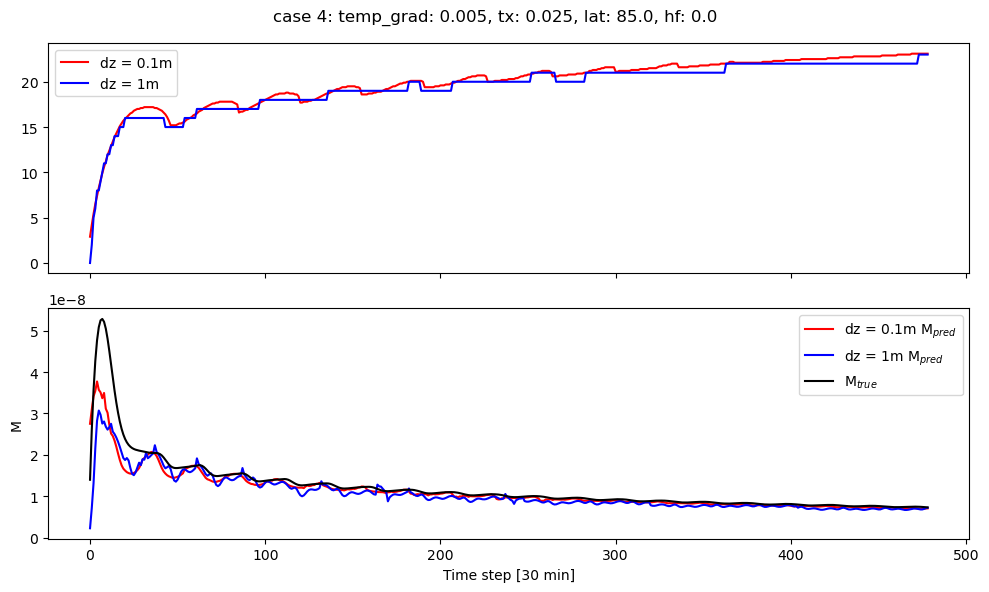

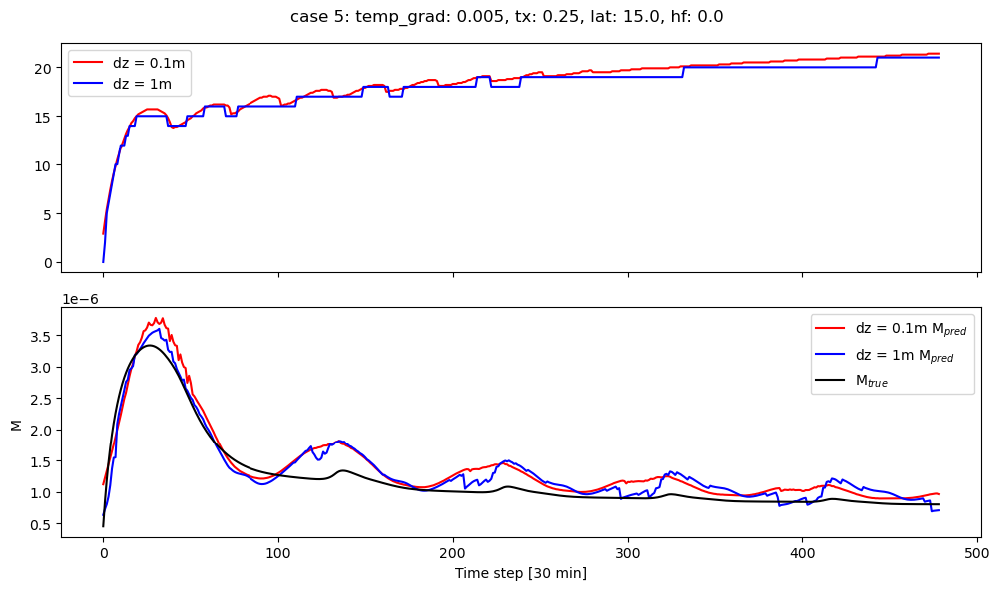

...

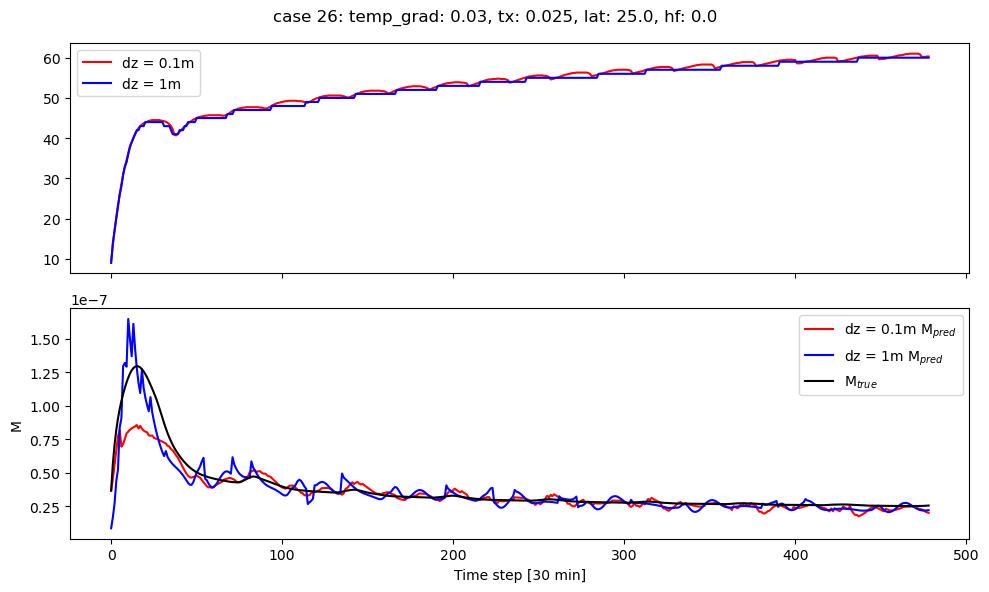

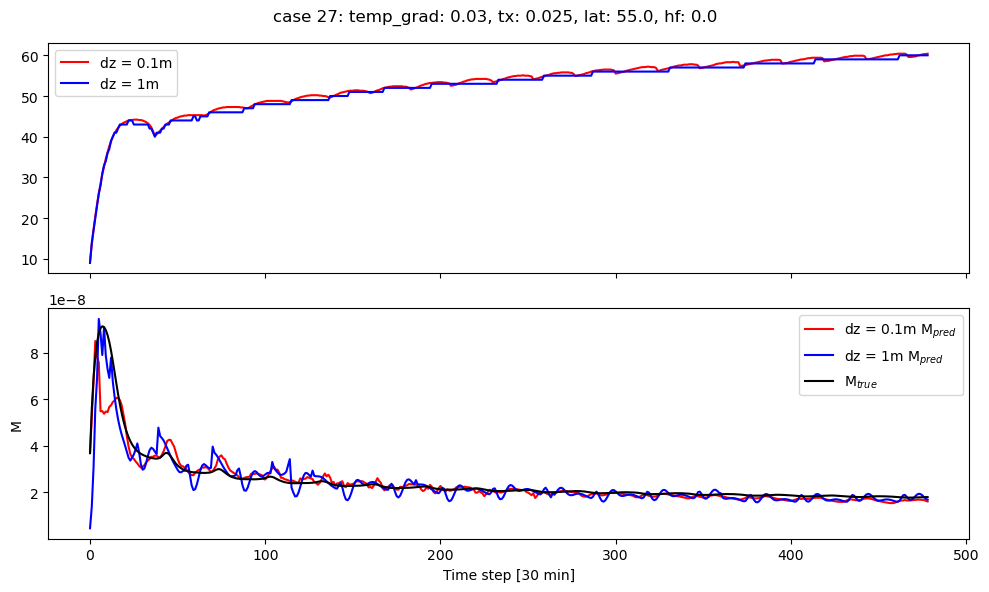

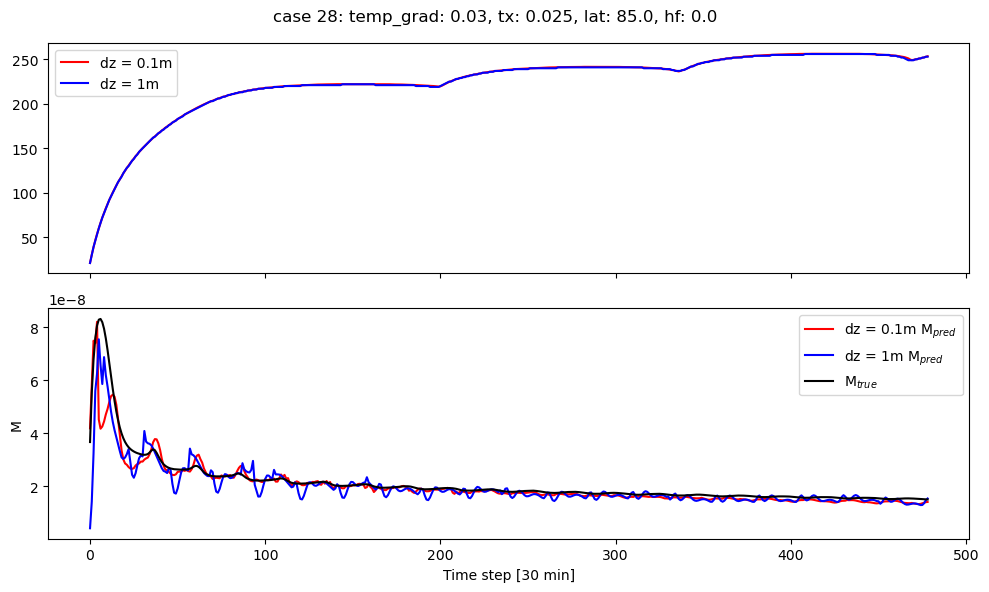

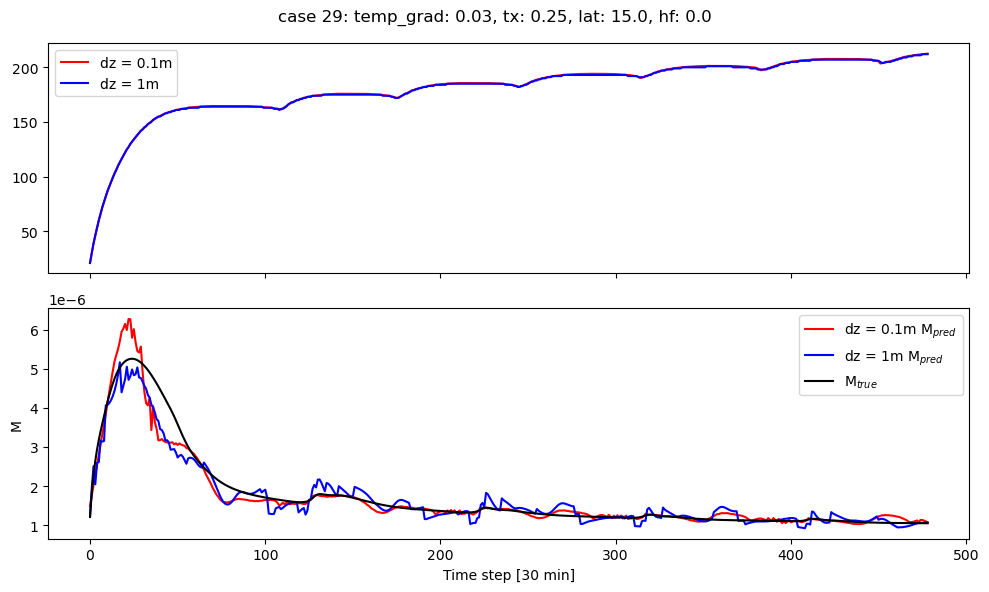

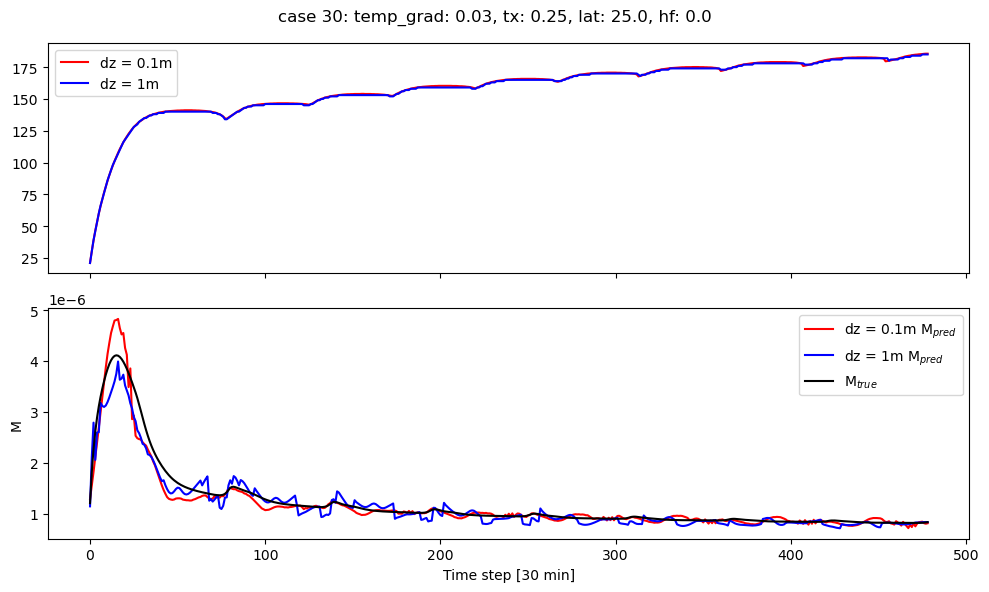

In [80]:
for i in range(30):
    case_specs = gotm_validation_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    fig, ax = plt.subplots(2,1,figsize=(10,6),tight_layout=True,sharex=True)
    plt.suptitle(f"case {i+1}: temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    ax[0].plot(X_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),2], label=f"{name_1}", color="red")
    ax[0].plot(X_2.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),2], label=f"{name_2}", color="blue")
    ax[0].legend()
    ax[1].plot(fcnn_prediction_val_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)]*0.1, label=f"{name_1} "+"M$_{pred}$", color="red")
    ax[1].plot(fcnn_prediction_val_2.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)], label=f"{name_2} "+"M$_{pred}$", color="blue")
    ax[1].plot(y_val_1[n_timesteps*i:n_timesteps*(i+1)]*0.1, label="M$_{true}$", color="black")
    ax[1].set_xlabel("Time step [30 min]")
    ax[1].set_ylabel("M")
    ax[1].legend()

/tmp/ipykernel_212438/2204882431.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(4,1,figsize=(10,10),tight_layout=True,sharex=True)


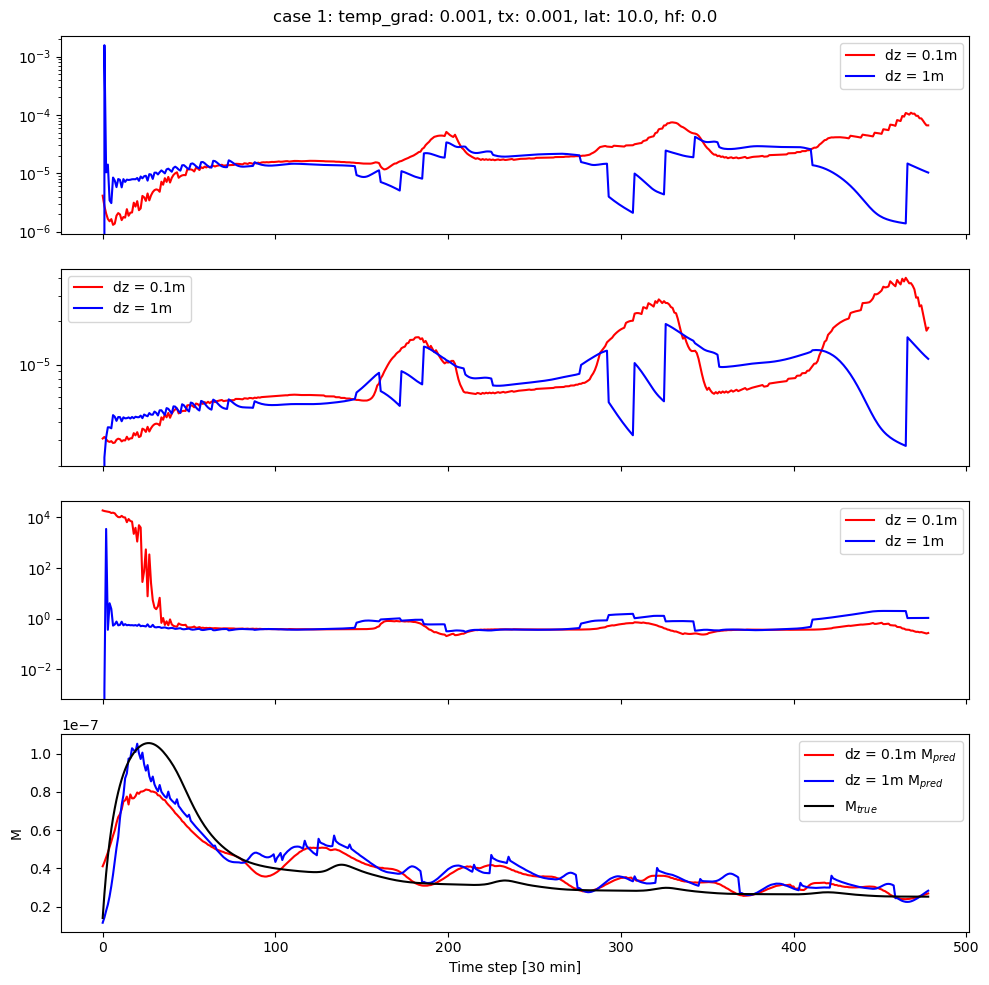

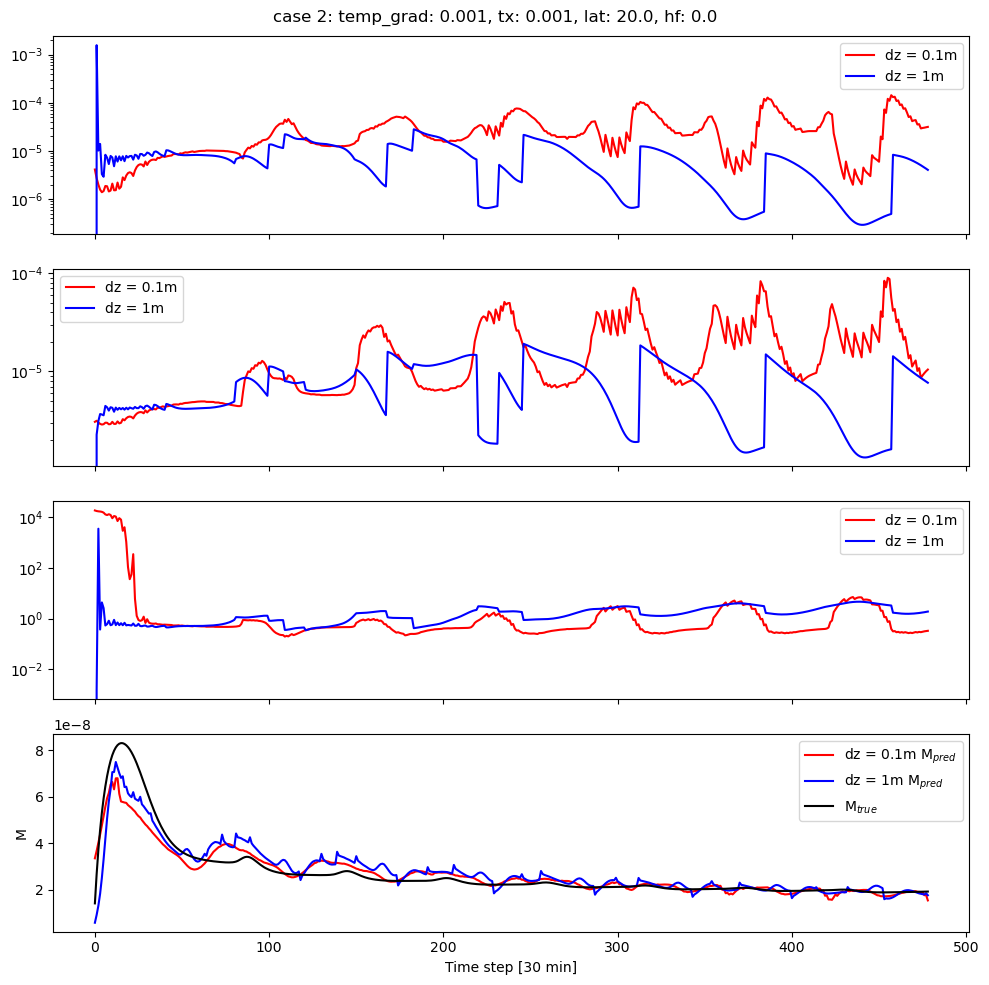

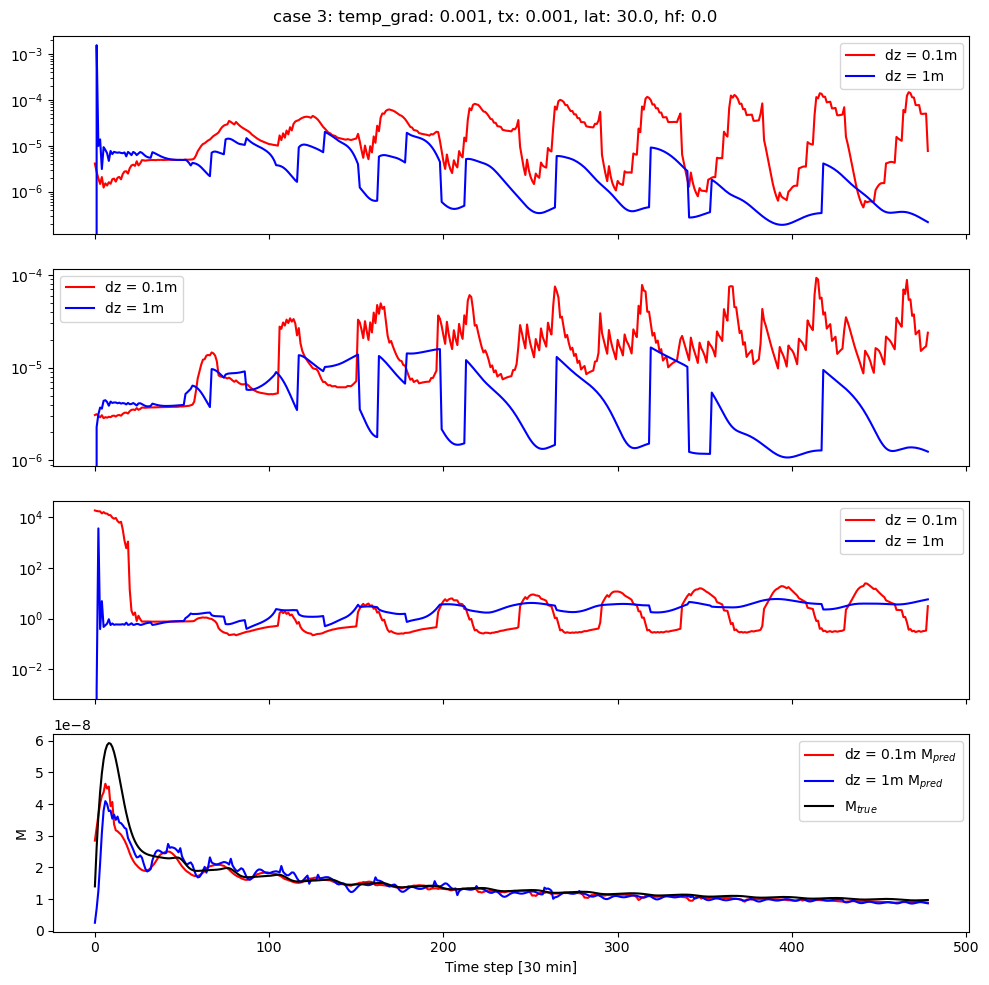

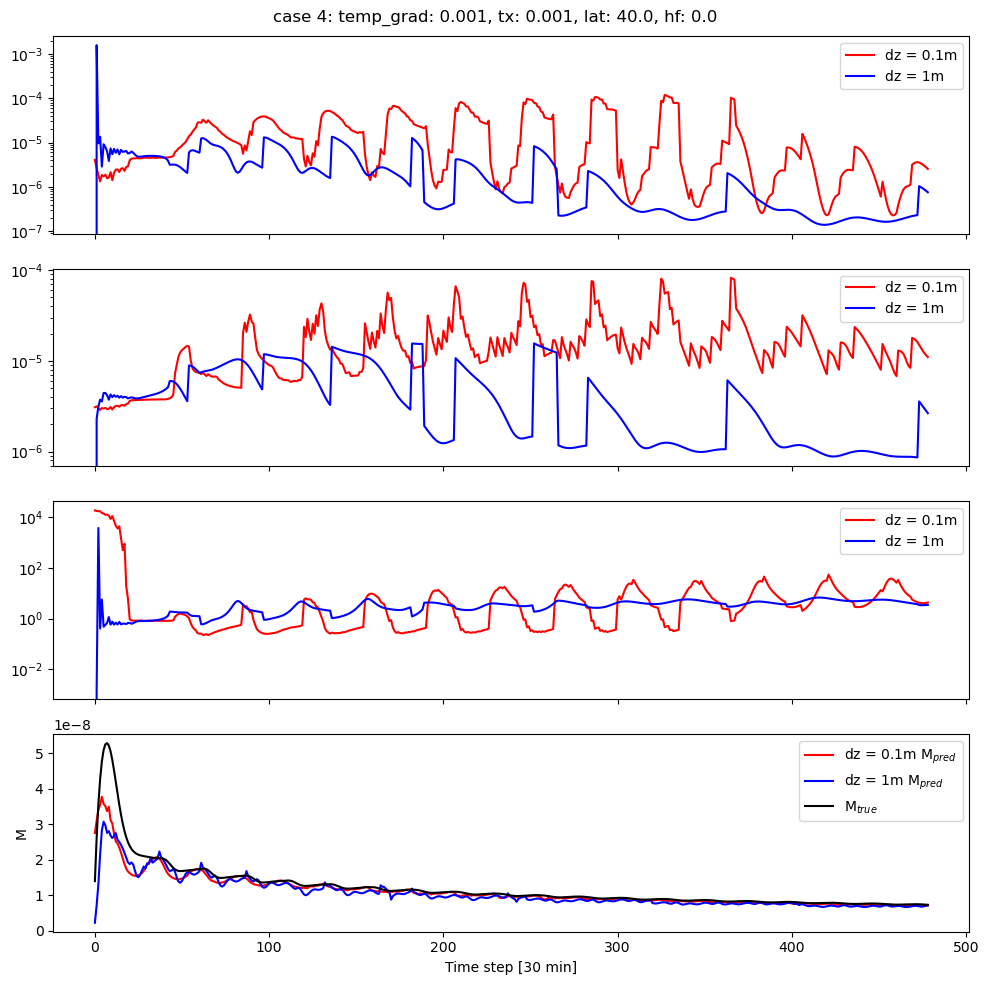

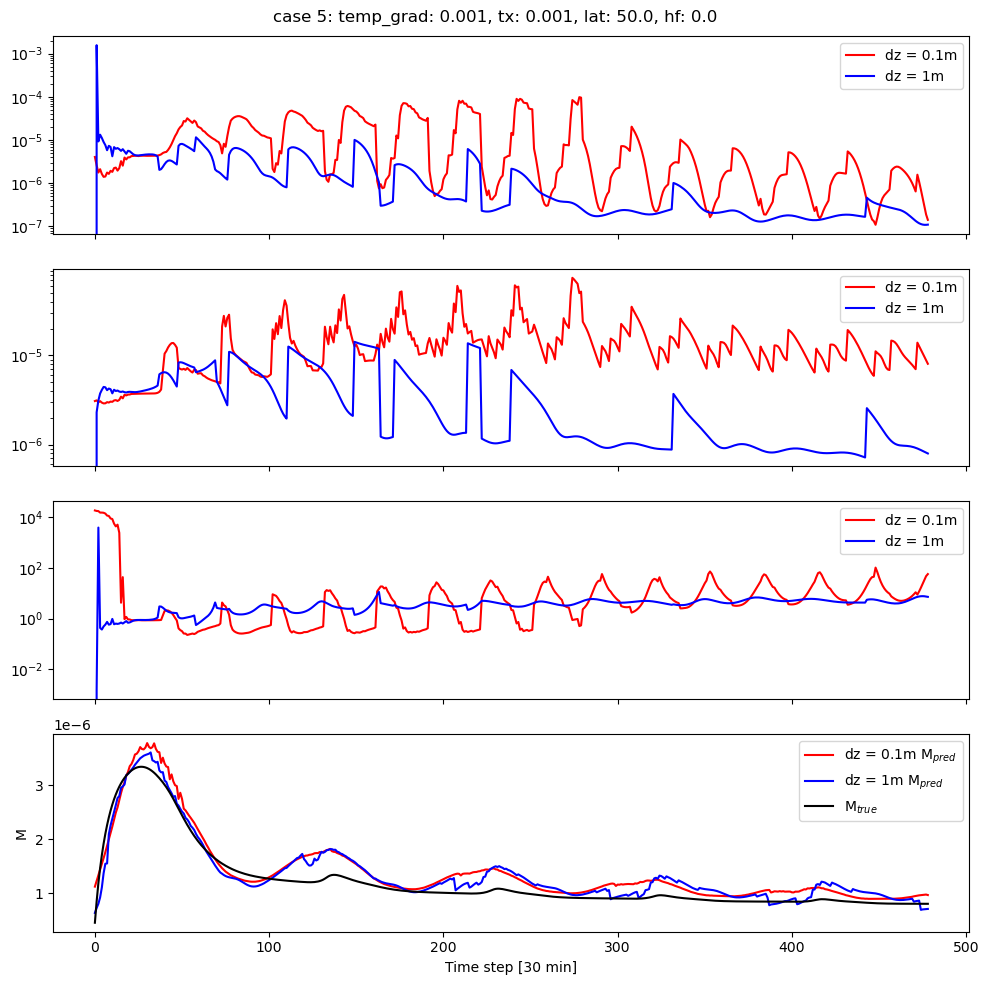

...

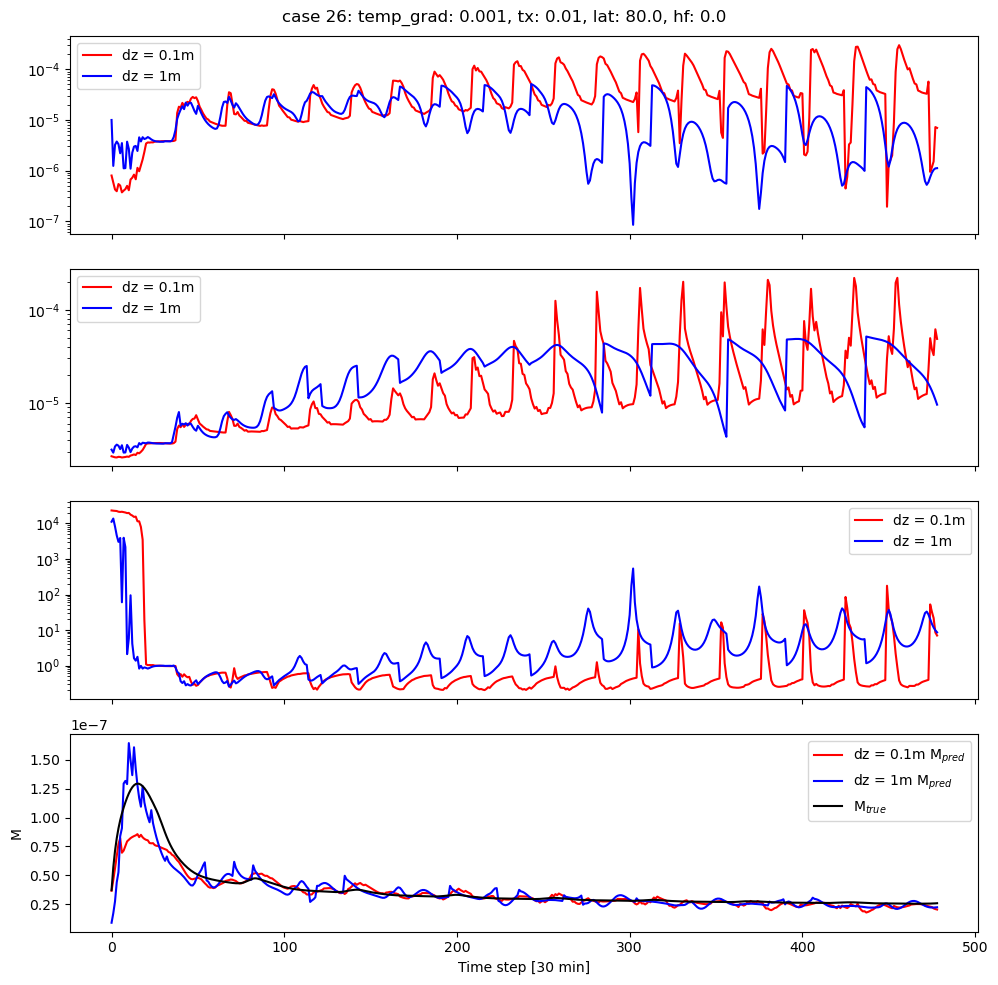

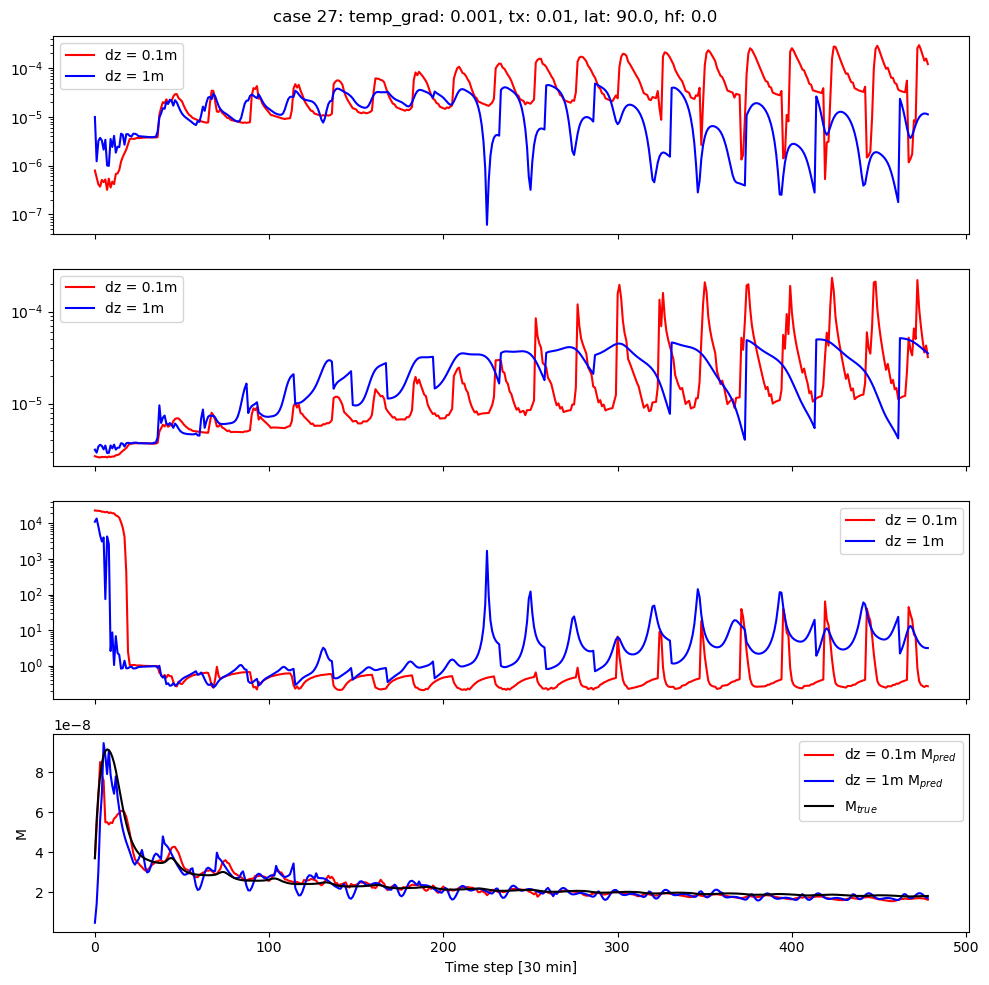

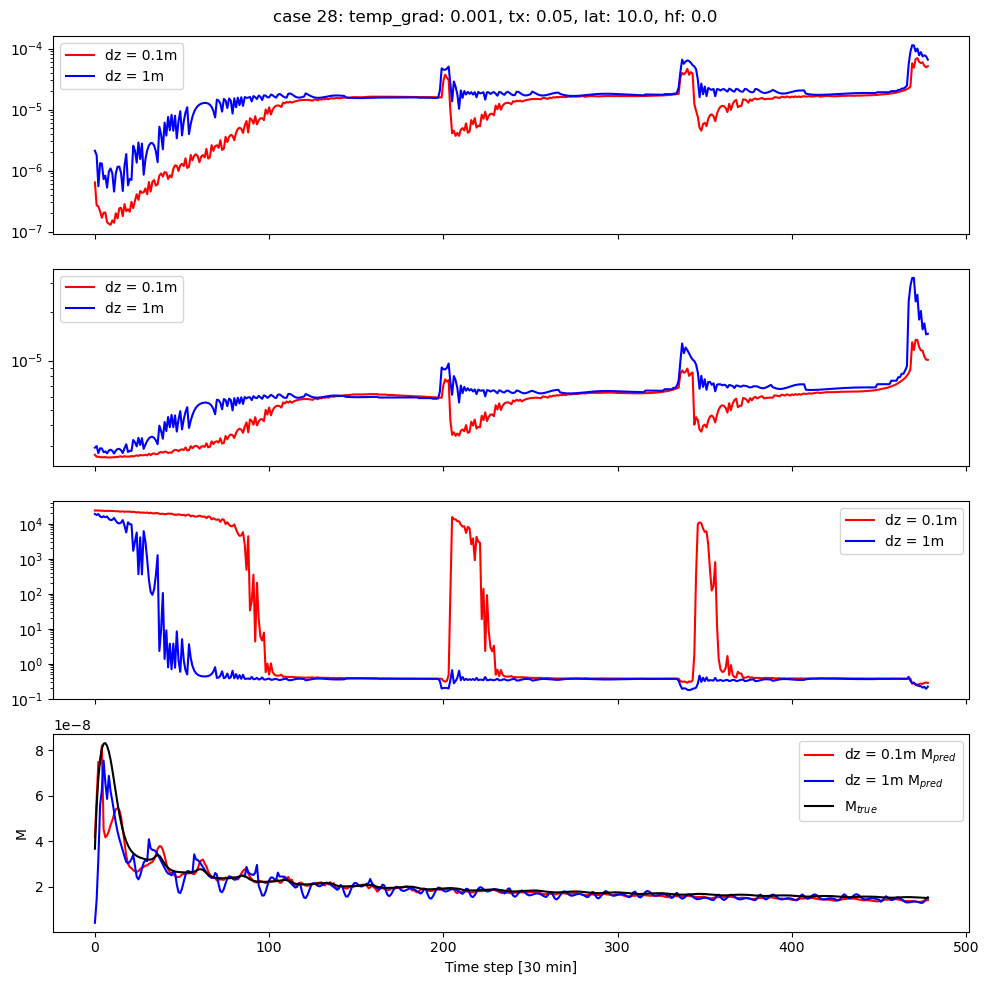

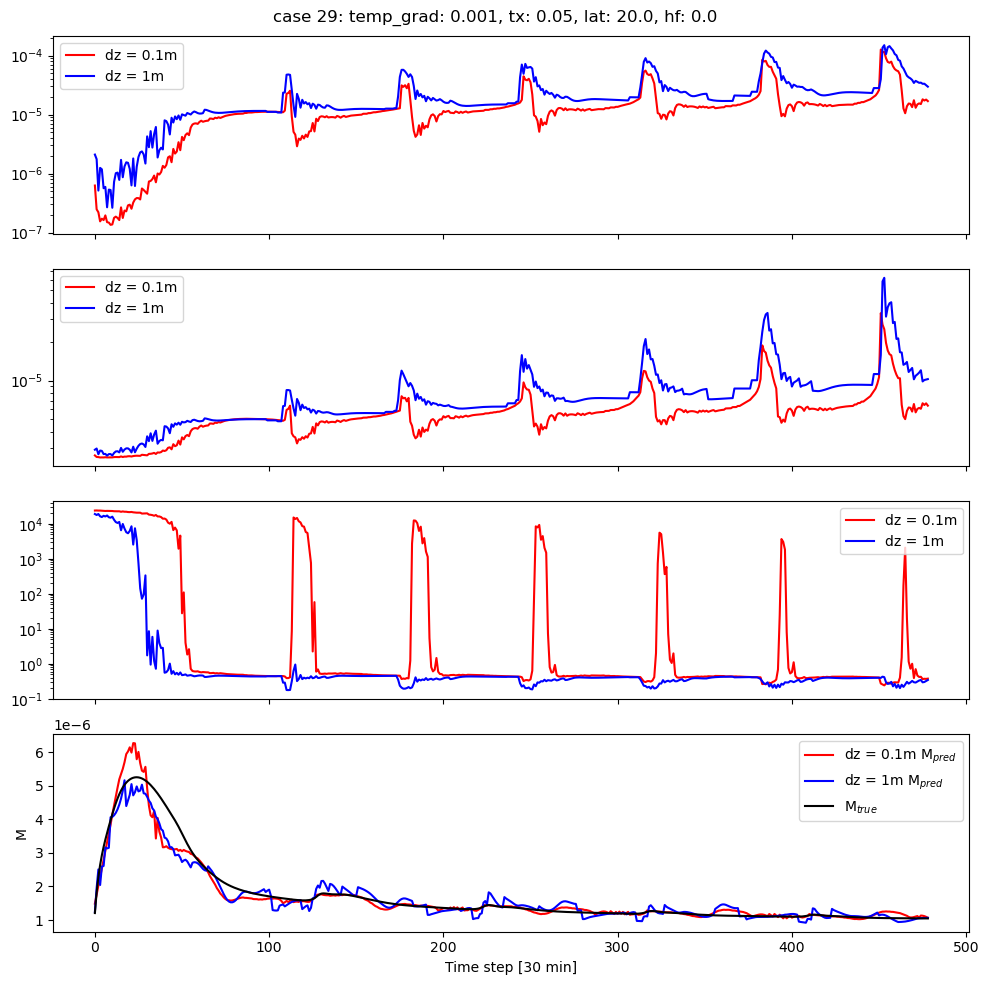

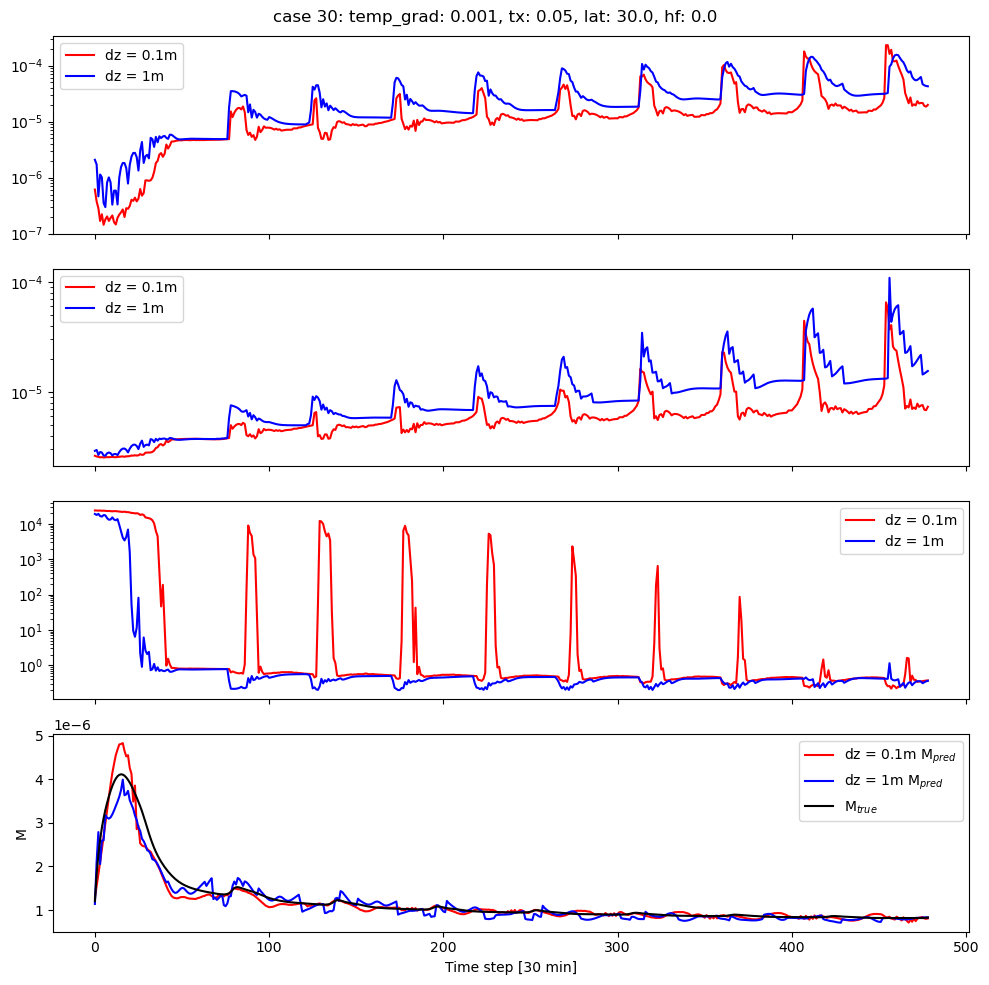

In [17]:
for i in range(30):
    case_specs = gotm_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    fig, ax = plt.subplots(4,1,figsize=(10,10),tight_layout=True,sharex=True)
    plt.suptitle(f"case {i+1}: temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    for j, k in enumerate([7,8,9]):
        ax[j].plot(X_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),k], label=f"{name_1}", color="red")
        ax[j].plot(X_2.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),k], label=f"{name_2}", color="blue")
        ax[j].legend()
        ax[j].set_yscale("log")
    ax[-1].plot(fcnn_prediction_val_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)]*0.1, label=f"{name_1} "+"M$_{pred}$", color="red")
    ax[-1].plot(fcnn_prediction_val_2.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)], label=f"{name_2} "+"M$_{pred}$", color="blue")
    ax[-1].plot(y_val_1[n_timesteps*i:n_timesteps*(i+1)]*0.1, label="M$_{true}$", color="black")
    ax[-1].set_xlabel("Time step [30 min]")
    ax[-1].set_ylabel("M")
    ax[-1].legend()

/tmp/ipykernel_319224/3684124211.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(3,1,figsize=(10,10),tight_layout=True,sharex=True)


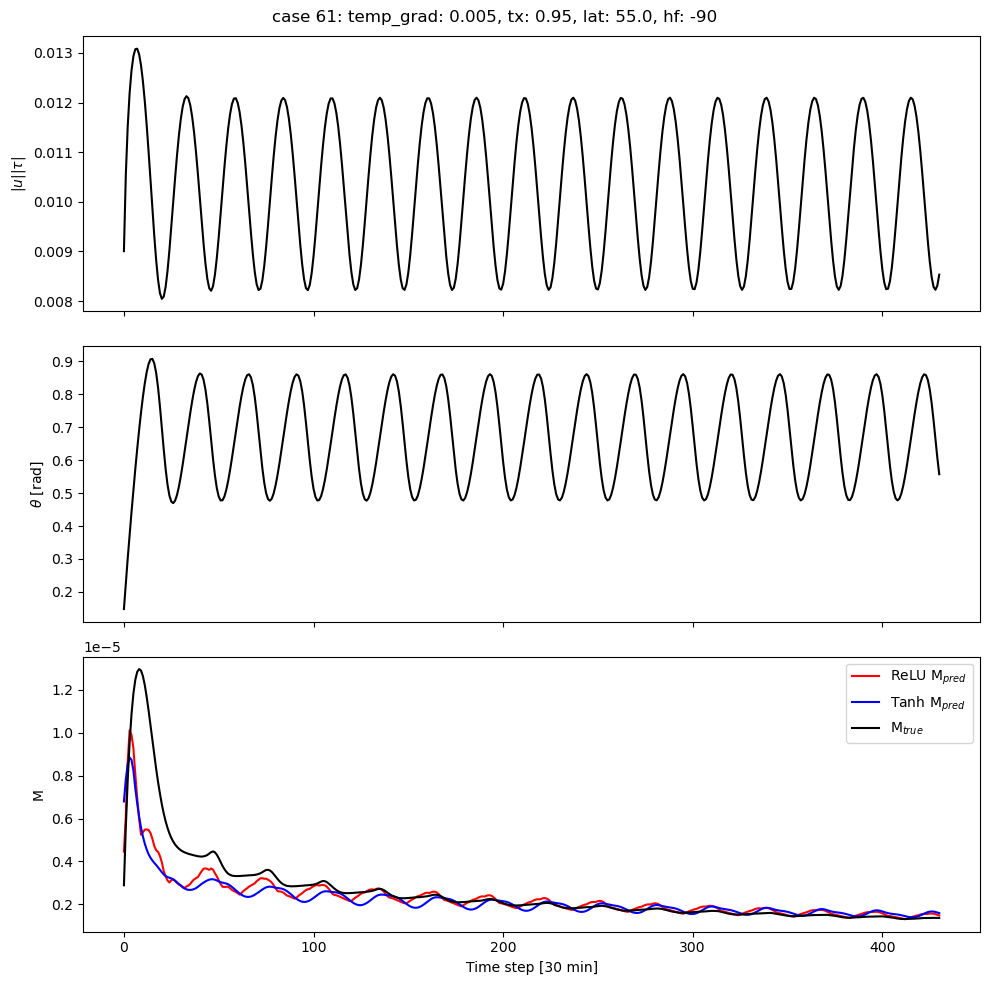

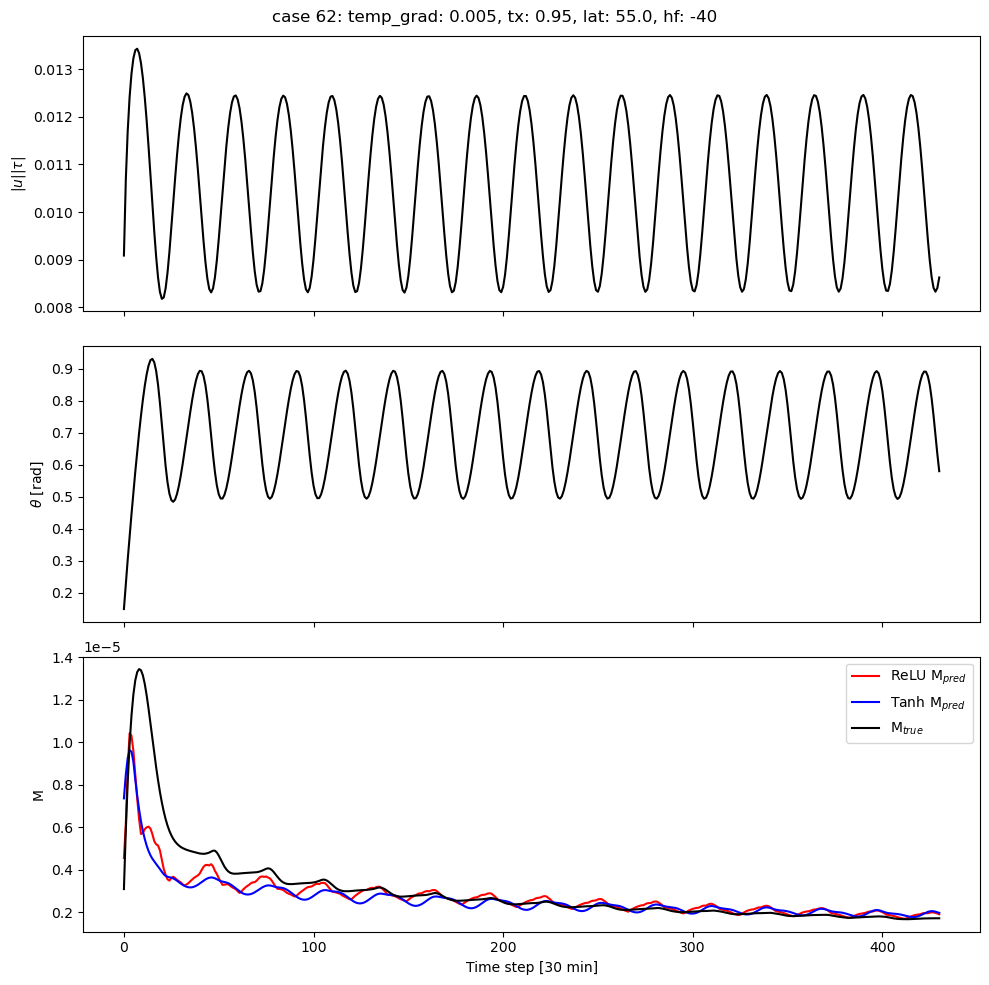

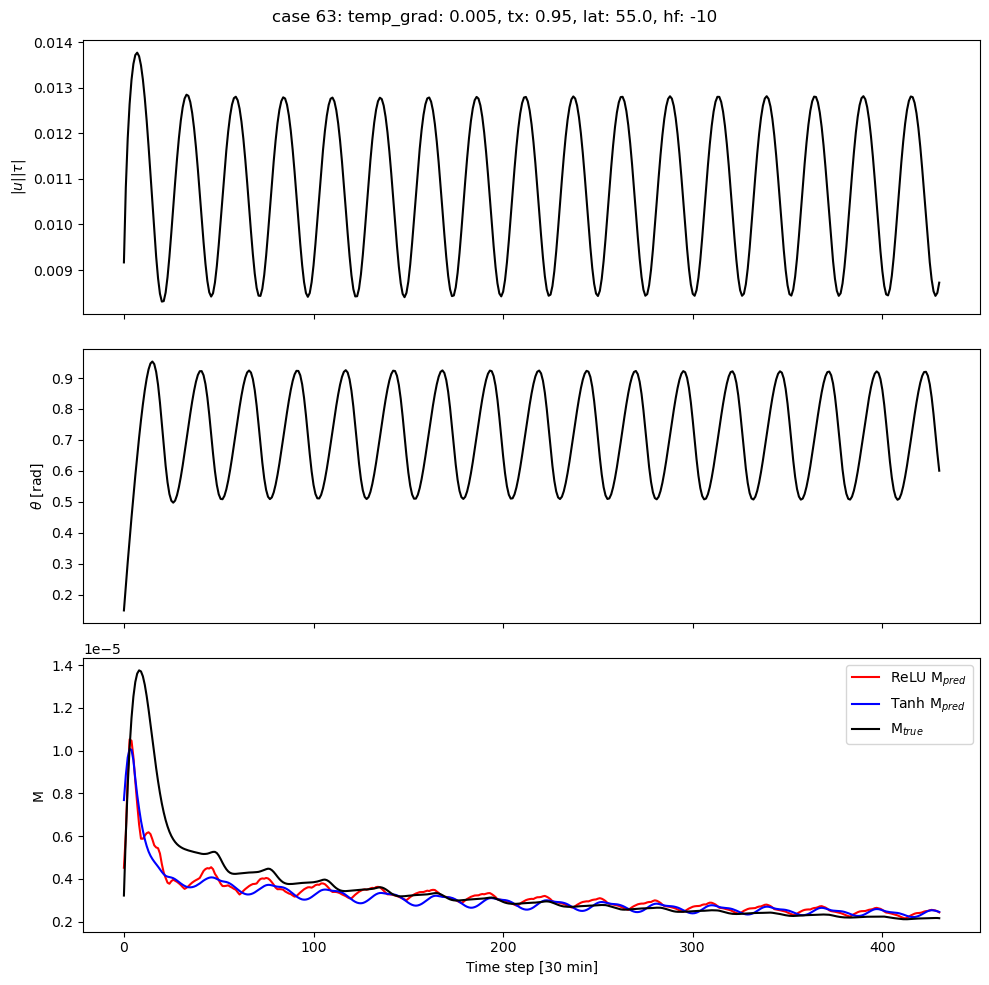

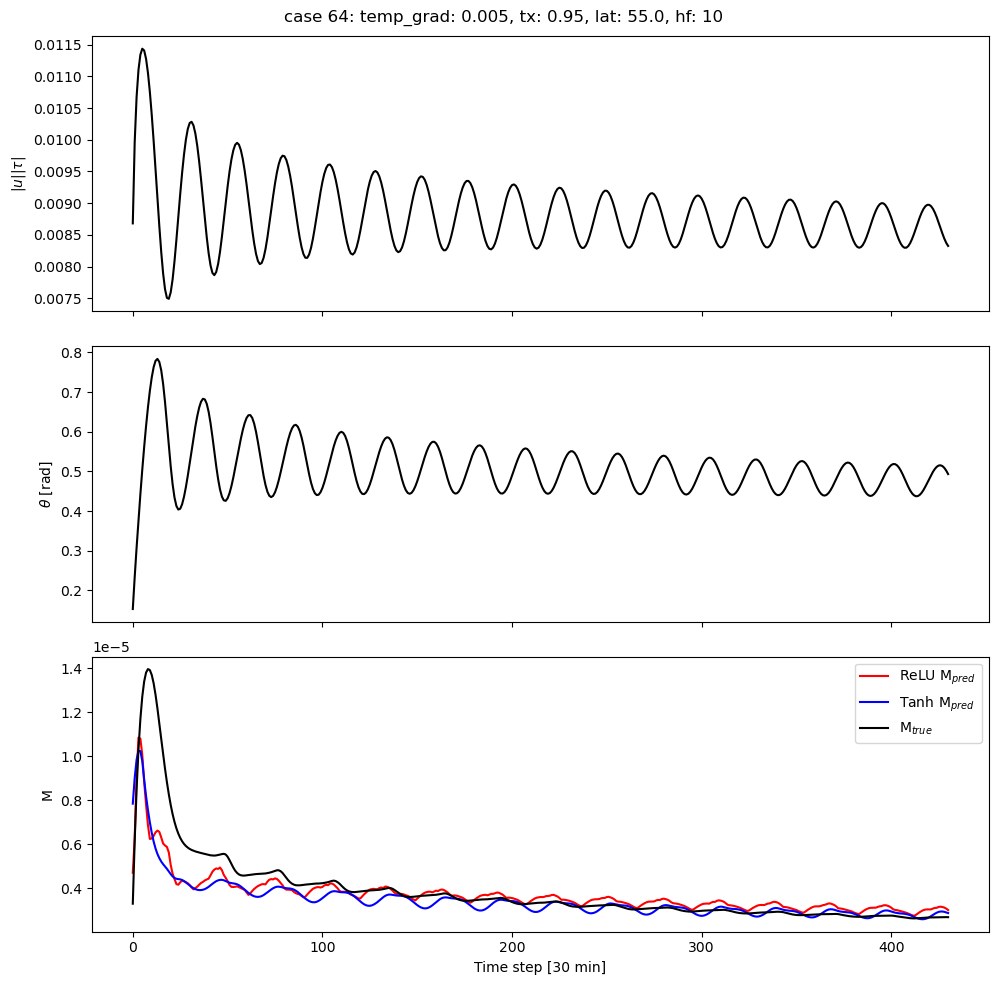

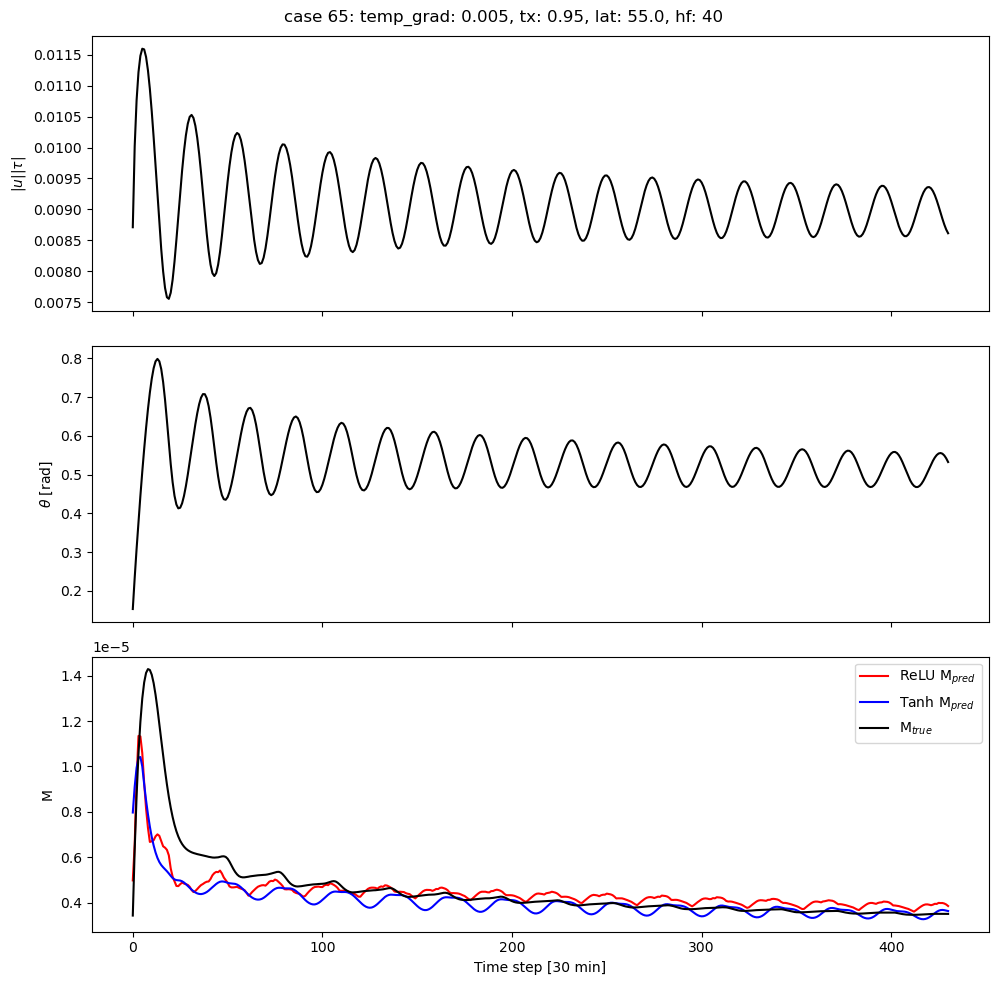

...

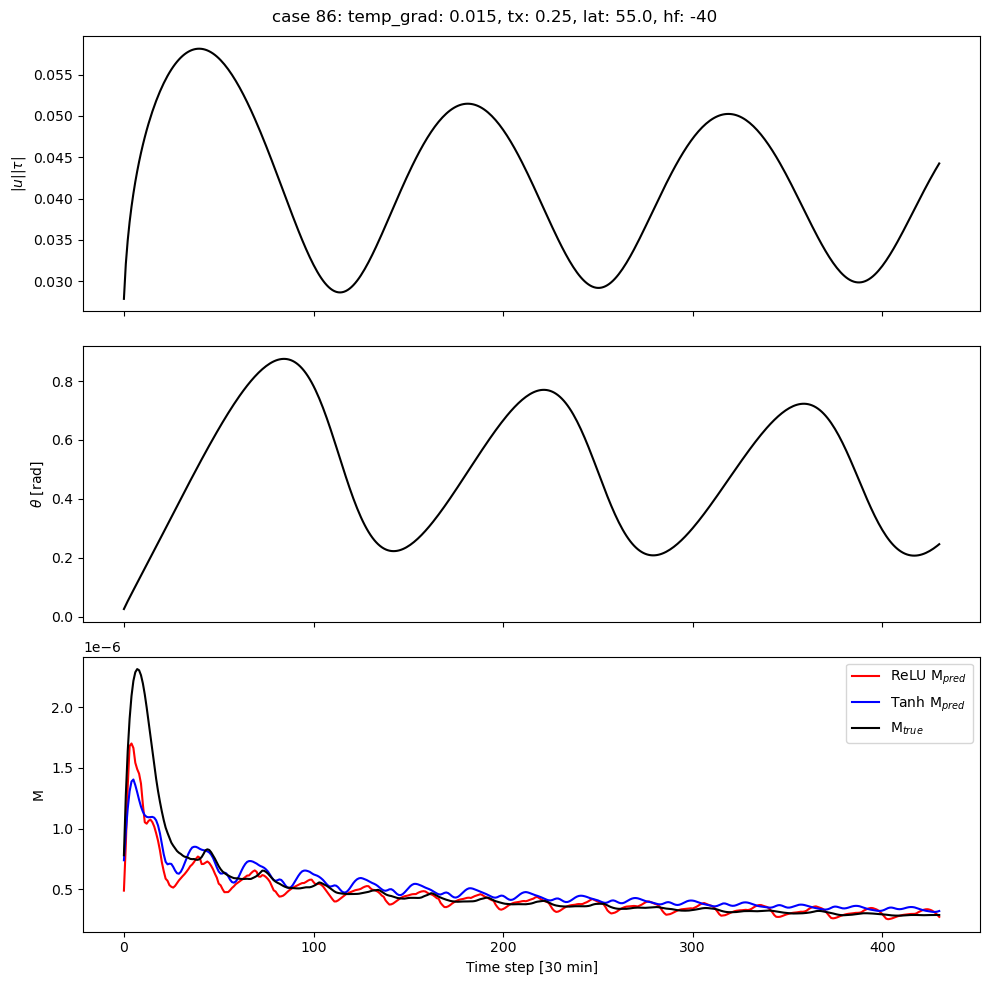

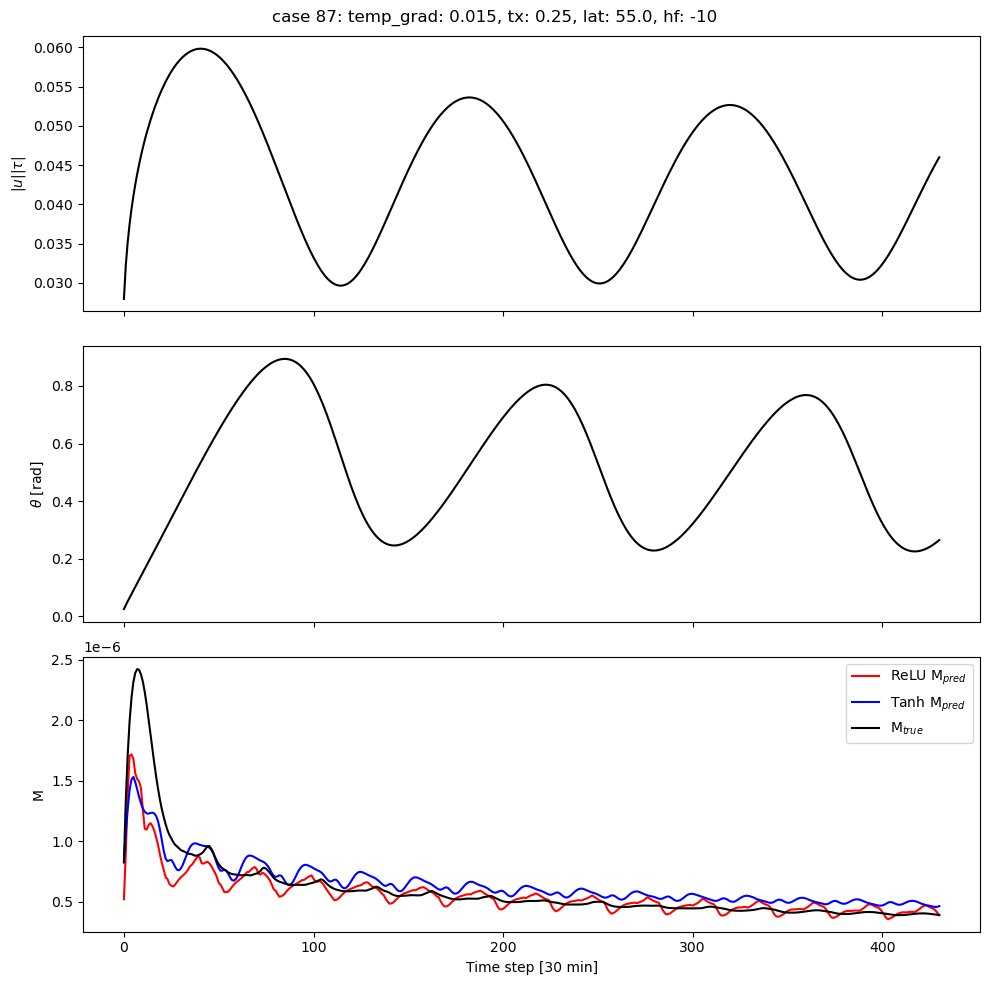

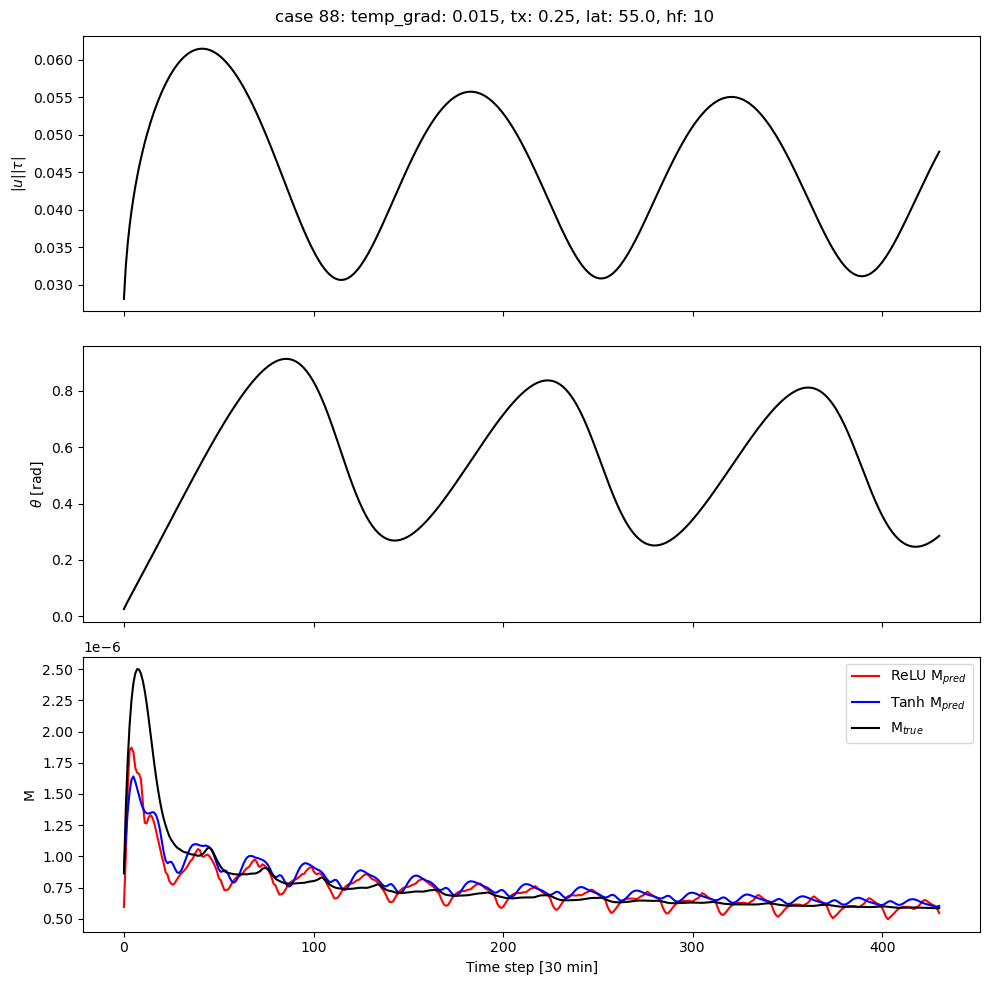

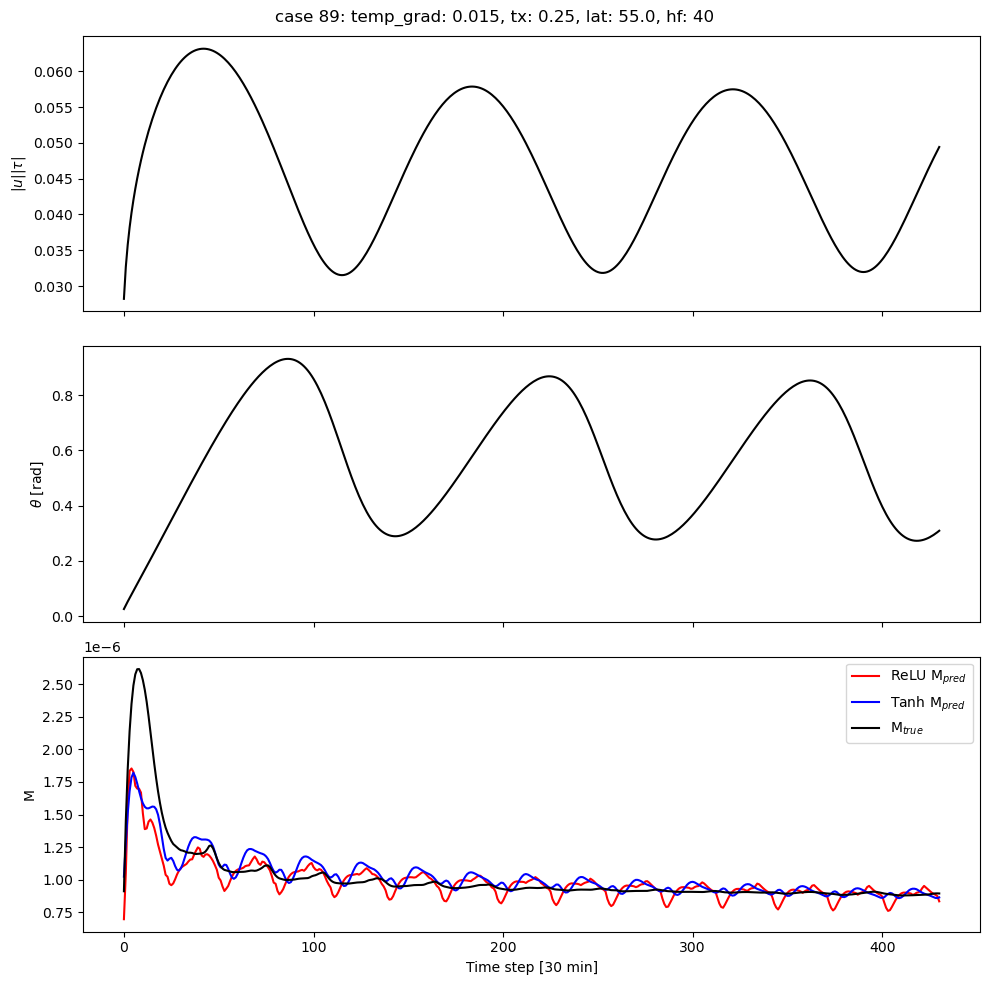

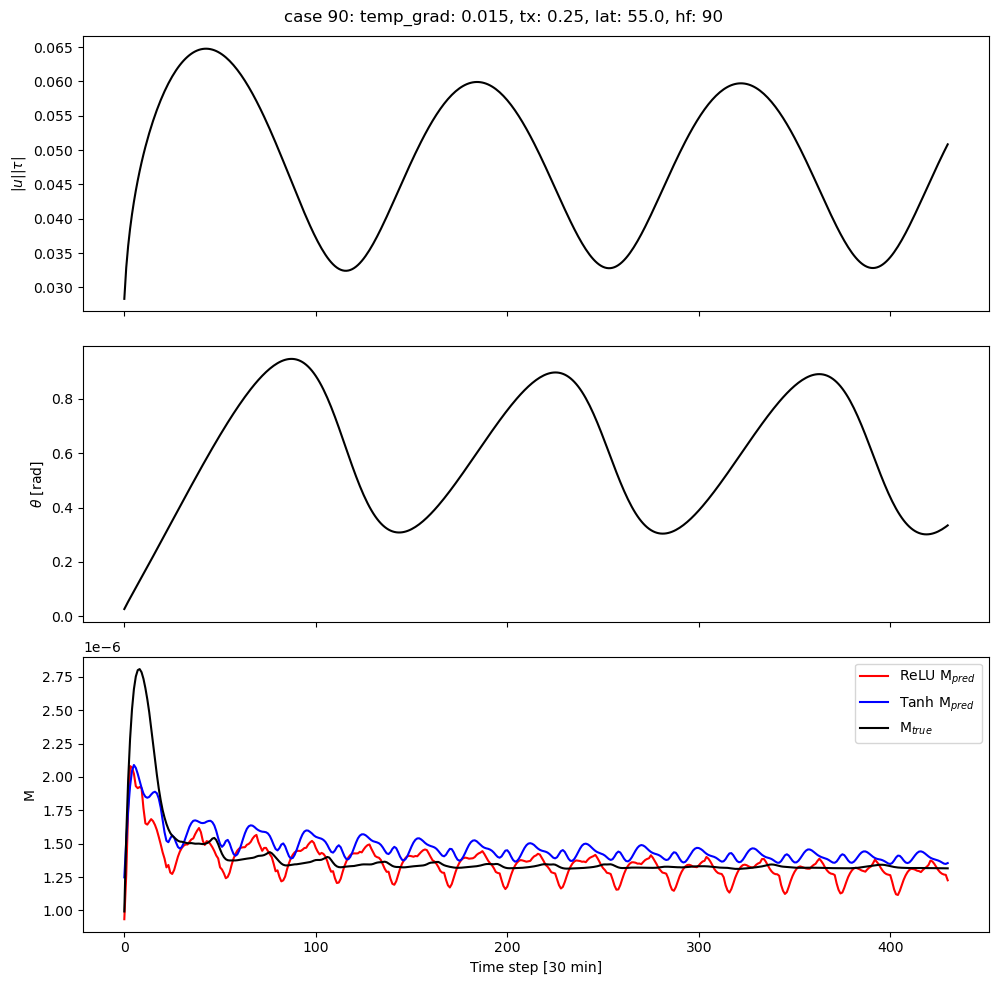

In [87]:
for i in range(60,90):
    case_specs = gotm_validation_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    fig, ax = plt.subplots(3,1,figsize=(10,10),tight_layout=True,sharex=True)
    plt.suptitle(f"case {i+1}: temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    ax[0].plot(X_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),4], label=f"{name_1}", color="black")
    ax[0].set_ylabel(r"$|u||\tau|$")
    ax[1].set_ylabel(r"$\theta$ [rad]")
    ax[1].plot(X_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1),5], label=f"{name_2}", color="black")
    ax[2].plot(fcnn_prediction_val_1.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)], label=f"{name_1} "+"M$_{pred}$", color="red")
    ax[2].plot(fcnn_prediction_val_2.detach().numpy()[n_timesteps*i:n_timesteps*(i+1)], label=f"{name_2} "+"M$_{pred}$", color="blue")
    ax[2].plot(y_val_1[n_timesteps*i:n_timesteps*(i+1)], label="M$_{true}$", color="black")
    ax[2].set_xlabel("Time step [30 min]")
    ax[2].set_ylabel("M")
    ax[2].legend()